<a href="https://colab.research.google.com/github/sexymonster/DO_EAT/blob/model/doeat_yolov5n.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. 인트로

## 1-1. 학습 모델 설명

식재료를 분류할 수 있는 모델을 학습 시키기 위해 YOLOv5를 사용하기로 함

YOLOv5에서도 AI 가속기 모델이 nano, small, medium, large, xlarge 가 있는데, 가속기 모델별로 성능을 비교 해 보기로 함

그 중에서 이번 파일은 nano모델로 학습을 시켜보았다.

YOLOv5 :  https://github.com/ultralytics/yolov5.git

## 1-2. yolov5 패키지 다운로드

깃허브에서 yolov5를 클론합니다.

In [1]:
%cd /content
!git clone https://github.com/ultralytics/yolov5.git

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 12004, done.
remote: Counting objects: 100% (20/20), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 12004 (delta 5), reused 6 (delta 3), pack-reused 11984
Receiving objects: 100% (12004/12004), 12.47 MiB | 30.41 MiB/s, done.
Resolving deltas: 100% (8247/8247), done.


yolov5 패키지를 다운로드합니다.

In [2]:
%cd /content/yolov5/
!pip install -r requirements.txt

/content/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 39.2 MB/s 


## 1-3. 패키지 로드

In [3]:
# for file load
from google.colab import drive
from glob import glob

# for edit yaml file
import yaml

# for prediction
from IPython.display import Image
import os

# for read image
from google.colab.patches import cv2_imshow
import cv2

## 1-4. 데이터 로드

구글 드라이브 마운트 하기

In [4]:
drive.mount("/content/gdrive")

Mounted at /content/gdrive


train, valid, test 파일들을 각각 리스트로 불러오기

In [5]:
%cd /

img_train_list = glob('/content/gdrive/MyDrive/ColabNotebooks/do_eat/train/images/*.jpg')
img_valid_list = glob('/content/gdrive/MyDrive/ColabNotebooks/do_eat/valid/images/*.jpg')
img_test_list = glob('/content/gdrive/MyDrive/ColabNotebooks/do_eat/test/images/*.jpg')


print("train 데이터 개수 :",len(img_train_list))
print("valid 데이터 개수 :",len(img_valid_list))
print("test 데이터 개수 :",len(img_test_list))

/
train 데이터 개수 : 631
valid 데이터 개수 : 179
test 데이터 개수 : 95


# 2. 데이터 전처리

## 2-1. data.yaml 파일 수정

yaml파일의 train 데이터와 valid 데이터 확인하기

In [6]:
%cat /content/gdrive/MyDrive/ColabNotebooks/do_eat/data.yaml
# nc : 클래스개수, names : 클래스명

train: ../train/images
val: ../valid/images

nc: 11
names: ['bean sprouts', 'beef', 'chicken', 'egg', 'pork', 'garlic', 'green onion', 'kimchi', 'onion', 'potato', 'spam']

train, valid, test 데이터들을 텍스트 파일로 저장

In [7]:
with open('/content/gdrive/MyDrive/ColabNotebooks/do_eat/train.txt','w') as f:
  f.write('\n'.join(img_train_list)+'\n')

with open('/content/gdrive/MyDrive/ColabNotebooks/do_eat/valid.txt','w') as f:
  f.write('\n'.join(img_valid_list)+'\n')

with open('/content/gdrive/MyDrive/ColabNotebooks/do_eat/test.txt','w') as f:
  f.write('\n'.join(img_test_list)+'\n')


data.yaml 파일의 train, valid 데이터를 수정하여 data1.yaml 파일로 저장

In [8]:
with open('/content/gdrive/MyDrive/ColabNotebooks/do_eat/data.yaml','r') as f:
  data1 = yaml.load(f,Loader=yaml.FullLoader)

data1

{'train': '../train/images',
 'val': '../valid/images',
 'nc': 11,
 'names': ['bean sprouts',
  'beef',
  'chicken',
  'egg',
  'pork',
  'garlic',
  'green onion',
  'kimchi',
  'onion',
  'potato',
  'spam']}

In [9]:
data1['train'] = '/content/gdrive/MyDrive/ColabNotebooks/do_eat/train.txt'
data1['val'] = '/content/gdrive/MyDrive/ColabNotebooks/do_eat/valid.txt'

with open('/content/gdrive/MyDrive/ColabNotebooks/do_eat/data1.yaml', 'w') as f:
  yaml.dump(data1, f)

data1

{'train': '/content/gdrive/MyDrive/ColabNotebooks/do_eat/train.txt',
 'val': '/content/gdrive/MyDrive/ColabNotebooks/do_eat/valid.txt',
 'nc': 11,
 'names': ['bean sprouts',
  'beef',
  'chicken',
  'egg',
  'pork',
  'garlic',
  'green onion',
  'kimchi',
  'onion',
  'potato',
  'spam']}

# 3. 모델 학습

## 3-1. 학습 I

img_size = 416\
batch_size = 16\
epochs = 300\
data = data1.yaml\
cfg = yolov5n.yaml\
weights = yolov5n.pt\
name = doeat_yolov5n_results


In [10]:
%cd /content/yolov5/

# train.py로 data1.yaml파일 학습시키기
!python train.py --img 416 --batch 16 --epochs 300 --data /content/gdrive/MyDrive/ColabNotebooks/do_eat/data1.yaml --cfg ./models/yolov5n.yaml  --weights yolov5n.pt --name doeat_yolov5n_results

/content/yolov5
train: weights=yolov5n.pt, cfg=./models/yolov5n.yaml, data=/content/gdrive/MyDrive/ColabNotebooks/do_eat/data1.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=doeat_yolov5n_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-56-g30e674b Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=

## 3-2. 학습 결과 확인

학습 결과가 저장되어 있는 result.png 파일 열기

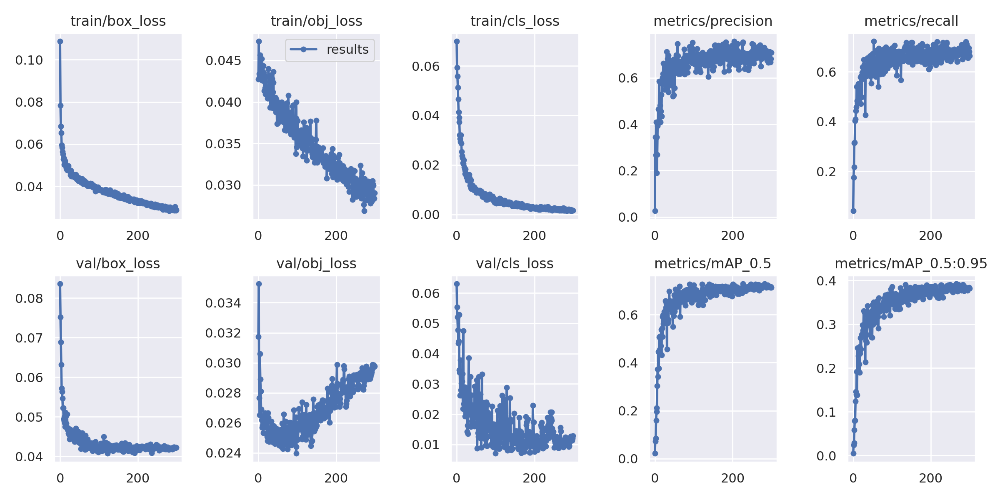

In [12]:
images = "/content/yolov5/runs/train/doeat_yolov5n_results/results.png"
image = cv2.imread(images)
cv2_imshow(image)

텐서보드로 학습 결과 확인하기

In [13]:
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs

<IPython.core.display.Javascript object>

# 4. 모델 검증

## 4-1. test 데이터로 추론하기

In [14]:
img_test_path = img_test_list[35]

!python detect.py --weights /content/yolov5/runs/train/doeat_yolov5n_results/weights/best.pt --img 416 --conf 0.5 --source "{img_test_path}"

detect: weights=['/content/yolov5/runs/train/doeat_yolov5n_results/weights/best.pt'], source=/content/gdrive/MyDrive/ColabNotebooks/do_eat/test/images/73-8801009860638_jpg.rf.e19f5e7bfcc87b38e70a343e65794a7f.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.2-56-g30e674b Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5n summary: 213 layers, 1774048 parameters, 0 gradients, 4.2 GFLOPs
image 1/1 /content/gdrive/MyDrive/ColabNotebooks/do_eat/test/images/73-8801009860638_jpg.rf.e19f5e7bfcc87b38e70a343e65794a7f.jpg: 416x416 1 kimchi, 8.5ms
Speed: 0.6ms pre-process, 8.5ms inference, 1.3ms NMS per image at shape (1

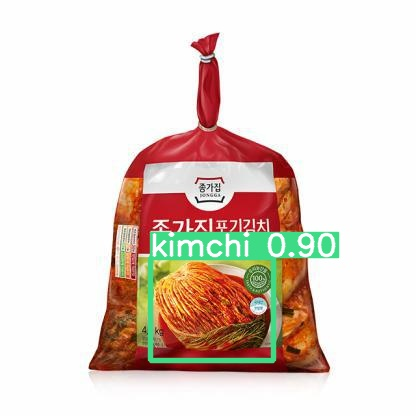

In [15]:
Image(os.path.join('/content/yolov5/runs/detect/exp',os.path.basename(img_test_path)))

In [16]:
img_test_path = img_test_list[75]

!python detect.py --weights /content/yolov5/runs/train/doeat_yolov5n_results/weights/best.pt --img 416 --conf 0.5 --source "{img_test_path}"

detect: weights=['/content/yolov5/runs/train/doeat_yolov5n_results/weights/best.pt'], source=/content/gdrive/MyDrive/ColabNotebooks/do_eat/test/images/21-h8jdh6t1zpla2f51kmuo_jpg.rf.b396d1ead770af495bee61b459632dda.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.2-56-g30e674b Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5n summary: 213 layers, 1774048 parameters, 0 gradients, 4.2 GFLOPs
image 1/1 /content/gdrive/MyDrive/ColabNotebooks/do_eat/test/images/21-h8jdh6t1zpla2f51kmuo_jpg.rf.b396d1ead770af495bee61b459632dda.jpg: 416x416 3 beefs, 7.2ms
Speed: 0.5ms pre-process, 7.2ms inference, 1.2ms NMS per imag

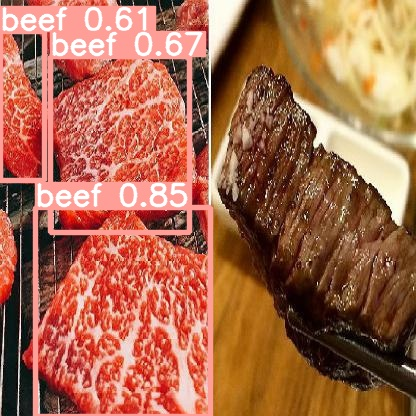

In [17]:
Image(os.path.join('/content/yolov5/runs/detect/exp2',os.path.basename(img_test_path)))

In [21]:
img_test_path = img_test_list[40]

!python detect.py --weights /content/yolov5/runs/train/doeat_yolov5n_results/weights/best.pt --img 416 --conf 0.5 --source "{img_test_path}"

detect: weights=['/content/yolov5/runs/train/doeat_yolov5n_results/weights/best.pt'], source=/content/gdrive/MyDrive/ColabNotebooks/do_eat/test/images/74-50aa1c3fe6134bf296d5139e146d4b65_jpg.rf.e17106b62e446afcfc3ddf0466dadd14.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.2-56-g30e674b Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5n summary: 213 layers, 1774048 parameters, 0 gradients, 4.2 GFLOPs
image 1/1 /content/gdrive/MyDrive/ColabNotebooks/do_eat/test/images/74-50aa1c3fe6134bf296d5139e146d4b65_jpg.rf.e17106b62e446afcfc3ddf0466dadd14.jpg: 416x416 12 potatos, 7.4ms
Speed: 0.5ms pre-process, 7.4ms in

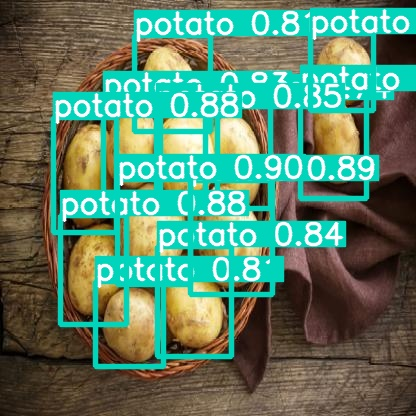

In [22]:
Image(os.path.join('/content/yolov5/runs/detect/exp6',os.path.basename(img_test_path)))

# 5. 저장

## 5-1. weight 저장하기

어떤 모델인지 알아 볼 수 있도록 파일명(best.pt) 변경

In [23]:
file_oldname = os.path.join("/content/yolov5/runs/train/doeat_yolov5n_results/weights", "best.pt")
file_newname_newfile = os.path.join("/content/yolov5/runs/train/doeat_yolov5n_results/weights", "yolov5n_best.pt")

os.rename(file_oldname, file_newname_newfile)

## 5-2. weight 파일을 .tflite로 변환

In [24]:
!PYTHONPATH=. python models/tf.py --weights /content/yolov5/runs/train/doeat_yolov5n_results/weights/yolov5n_best.pt --cfg models/yolov5n.yaml --img 320

usage: tf.py [-h] [--weights WEIGHTS] [--imgsz IMGSZ [IMGSZ ...]]
             [--batch-size BATCH_SIZE] [--dynamic]
tf.py: error: unrecognized arguments: --cfg models/yolov5n.yaml


In [25]:
!python export.py --weights yolov5n.pt --include tflite --img 320
!python detect.py --weights yolov5n-fp16.tflite --img 320

export: data=data/coco128.yaml, weights=['yolov5n.pt'], imgsz=[320], batch_size=1, device=cpu, half=False, inplace=False, train=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tflite']
YOLOv5 🚀 v6.2-56-g30e674b Python-3.7.13 torch-1.12.1+cu113 CPU

Fusing layers... 
YOLOv5n summary: 213 layers, 1867405 parameters, 0 gradients

PyTorch: starting from yolov5n.pt with output shape (1, 6300, 85) (3.9 MB)

TensorFlow SavedModel: starting export with tensorflow 2.8.2...

                 from  n    params  module                                  arguments                     
2022-08-25 15:05:41.553517: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
  0                -1  1      1760  models.common.Conv                      [3, 16, 

In [26]:
!python export.py --weights /content/yolov5/runs/train/doeat_yolov5n_results/weights/yolov5n_best.pt --include tflite --img 320
!python detect.py --weights yolov5n-fp16.tflite --img 320

export: data=data/coco128.yaml, weights=['/content/yolov5/runs/train/doeat_yolov5n_results/weights/yolov5n_best.pt'], imgsz=[320], batch_size=1, device=cpu, half=False, inplace=False, train=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tflite']
YOLOv5 🚀 v6.2-56-g30e674b Python-3.7.13 torch-1.12.1+cu113 CPU

Fusing layers... 
YOLOv5n summary: 213 layers, 1774048 parameters, 0 gradients, 4.2 GFLOPs

PyTorch: starting from /content/yolov5/runs/train/doeat_yolov5n_results/weights/yolov5n_best.pt with output shape (1, 6300, 16) (3.7 MB)

TensorFlow SavedModel: starting export with tensorflow 2.8.2...

                 from  n    params  module                                  arguments                     
2022-08-25 15:06:53.016661: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_